In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Data Cleaning

In [7]:
df = pd.read_csv('loan_data.csv')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      45000 non-null  float64
 1   person_gender                   45000 non-null  object 
 2   person_education                45000 non-null  object 
 3   person_income                   45000 non-null  float64
 4   person_emp_exp                  45000 non-null  int64  
 5   person_home_ownership           45000 non-null  object 
 6   loan_amnt                       45000 non-null  float64
 7   loan_intent                     45000 non-null  object 
 8   loan_int_rate                   45000 non-null  float64
 9   loan_percent_income             45000 non-null  float64
 10  cb_person_cred_hist_length      45000 non-null  float64
 11  credit_score                    45000 non-null  int64  
 12  previous_loan_defaults_on_file  

In [12]:
df.describe()

,person_age,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,loan_status
count,45000.000000,4.500000e+04,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000
mean,27.764178,8.031905e+04,5.410333,9583.157556,11.006606,0.139725,5.867489,632.608756,0.222222
std,6.045108,8.042250e+04,6.063532,6314.886691,2.978808,0.087212,3.879702,50.435865,0.415744
min,20.000000,8.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,390.000000,0.000000
25%,24.000000,4.720400e+04,1.000000,5000.000000,8.590000,0.070000,3.000000,601.000000,0.000000
50%,26.000000,6.704800e+04,4.000000,8000.000000,11.010000,0.120000,4.000000,640.000000,0.000000
75%,30.000000,9.578925e+04,8.000000,12237.250000,12.990000,0.190000,8.000000,670.000000,0.000000
max,144.000000,7.200766e+06,125.000000,35000.000000,20.000000,0.660000,30.000000,850.000000,1.000000


In [ ]:
df.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


In [14]:
print(df.isnull().sum())

person_age                        0
person_gender                     0
person_education                  0
person_income                     0
person_emp_exp                    0
person_home_ownership             0
loan_amnt                         0
loan_intent                       0
loan_int_rate                     0
loan_percent_income               0
cb_person_cred_hist_length        0
credit_score                      0
previous_loan_defaults_on_file    0
loan_status                       0
dtype: int64


In [41]:
print(f"\nOriginal dataset shape: {df.shape}")


Original dataset shape: (36226, 23)


In [15]:
df.dropna(inplace=True)

In [21]:
df.duplicated().sum()

0

In [16]:
df.drop_duplicates(inplace=True)

In [36]:
numerical_cols = ['person_age', 'person_income', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score']
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

In [40]:
print(f"\nShape after data cleaning: {df.shape}")


Shape after data cleaning: (36226, 23)


In [17]:
df['person_age'] = df['person_age'].astype(int)
df['person_income'] = df['person_income'].astype(float)
df['loan_amnt'] = df['loan_amnt'].astype(float)
df['loan_int_rate'] = df['loan_int_rate'].astype(float)
df['loan_percent_income'] = df['loan_percent_income'].astype(float)
df['cb_person_cred_hist_length'] = df['cb_person_cred_hist_length'].astype(int)
df['credit_score'] = df['credit_score'].astype(float)

In [31]:
non_numeric_cols = df.select_dtypes(include=['object']).columns
for col in non_numeric_cols:
    df[col] = df[col].astype('category').cat.codes

In [22]:
df = pd.get_dummies(df, columns=['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'loan_status'], drop_first=True)

# Univariate Analysis

In [42]:
df.describe()

,person_age,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file
count,36226.000000,36226.000000,36226.000000,36226.000000,36226.000000,36226.000000,36226.000000,36226.000000,36226.00000
mean,26.470850,70070.045299,4.150555,8276.826644,10.882207,0.129708,5.035720,632.327086,0.52316
std,3.951318,31566.785285,4.003604,4784.100025,2.928586,0.071571,2.689641,47.502944,0.49947
min,20.000000,8000.000000,0.000000,500.000000,5.420000,0.010000,2.000000,500.000000,0.00000
25%,23.000000,46467.750000,1.000000,4800.000000,8.490000,0.070000,3.000000,601.000000,0.00000
50%,25.000000,64801.500000,3.000000,7323.000000,11.010000,0.120000,4.000000,639.000000,1.00000
75%,29.000000,88620.000000,7.000000,11046.250000,12.920000,0.180000,7.000000,668.000000,1.00000
max,39.000000,166754.000000,21.000000,22500.000000,19.690000,0.320000,13.000000,762.000000,1.00000



Summary Statistics for person_age:
count    45000.000000
mean        27.764178
std          6.045108
min         20.000000
25%         24.000000
50%         26.000000
75%         30.000000
max        144.000000
Name: person_age, dtype: float64


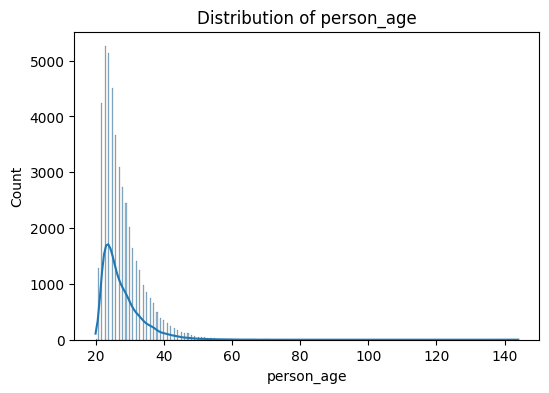

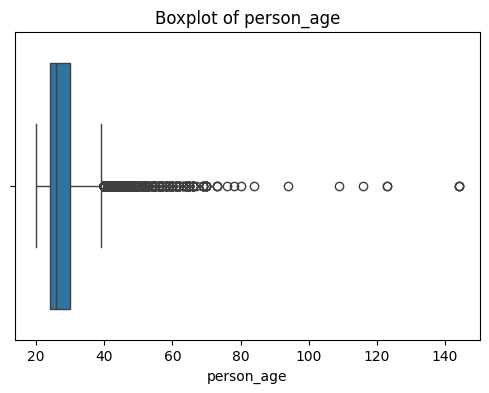


Summary Statistics for person_income:
count    4.500000e+04
mean     8.031905e+04
std      8.042250e+04
min      8.000000e+03
25%      4.720400e+04
50%      6.704800e+04
75%      9.578925e+04
max      7.200766e+06
Name: person_income, dtype: float64


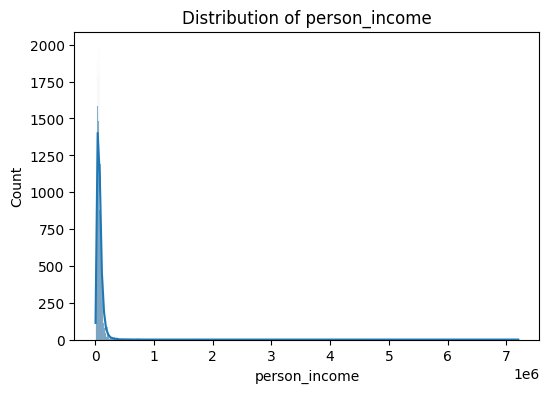

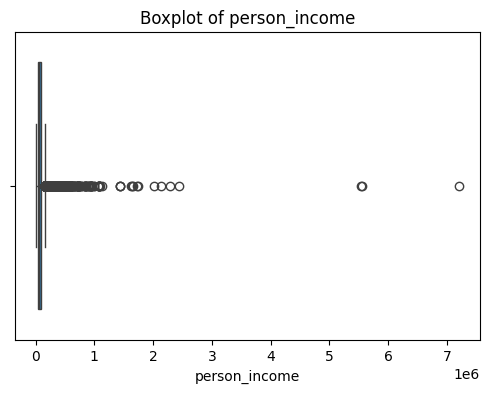


Summary Statistics for loan_amnt:
count    45000.000000
mean      9583.157556
std       6314.886691
min        500.000000
25%       5000.000000
50%       8000.000000
75%      12237.250000
max      35000.000000
Name: loan_amnt, dtype: float64


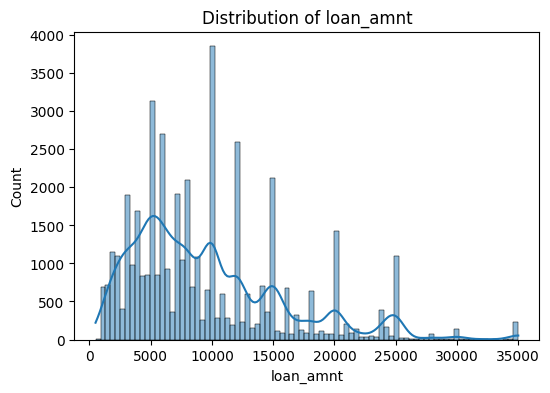

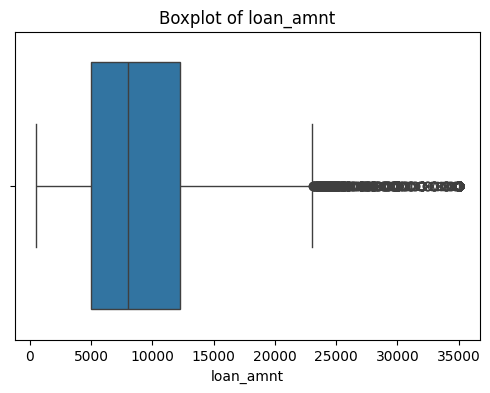


Summary Statistics for loan_int_rate:
count    45000.000000
mean        11.006606
std          2.978808
min          5.420000
25%          8.590000
50%         11.010000
75%         12.990000
max         20.000000
Name: loan_int_rate, dtype: float64


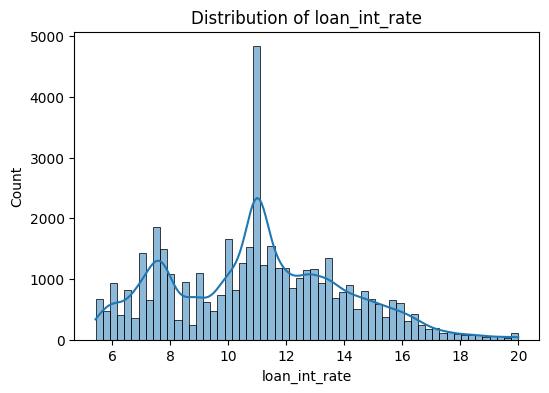

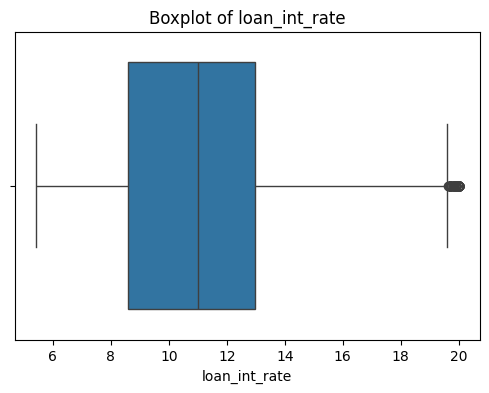


Summary Statistics for loan_percent_income:
count    45000.000000
mean         0.139725
std          0.087212
min          0.000000
25%          0.070000
50%          0.120000
75%          0.190000
max          0.660000
Name: loan_percent_income, dtype: float64


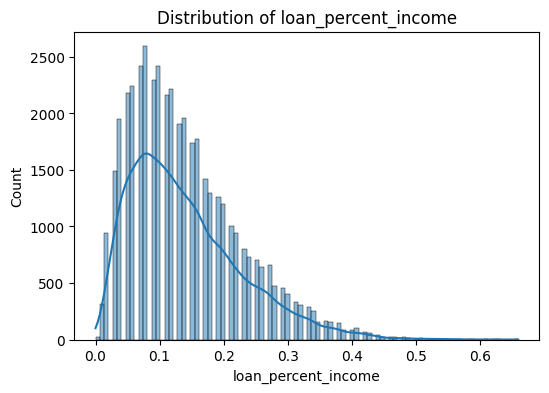

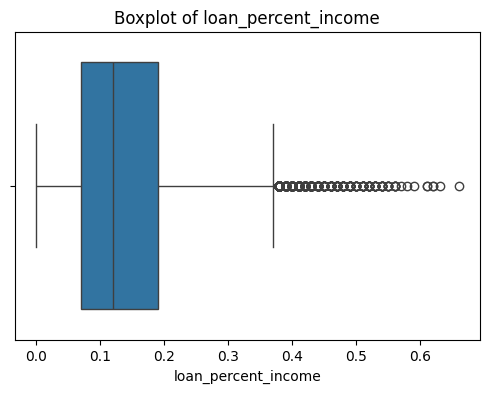


Summary Statistics for cb_person_cred_hist_length:
count    45000.000000
mean         5.867489
std          3.879702
min          2.000000
25%          3.000000
50%          4.000000
75%          8.000000
max         30.000000
Name: cb_person_cred_hist_length, dtype: float64


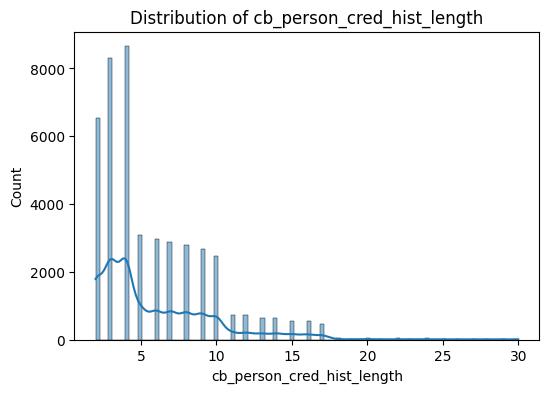

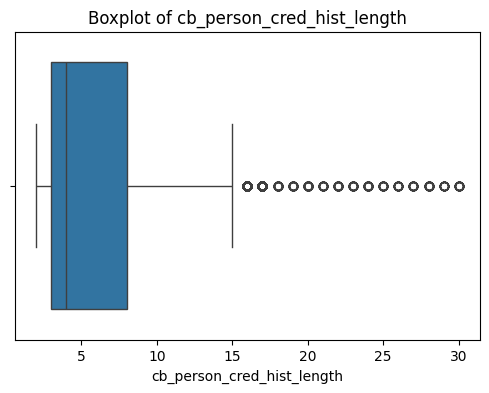


Summary Statistics for credit_score:
count    45000.000000
mean       632.608756
std         50.435865
min        390.000000
25%        601.000000
50%        640.000000
75%        670.000000
max        850.000000
Name: credit_score, dtype: float64


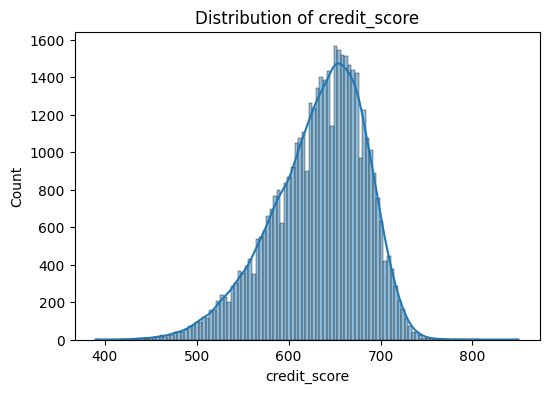

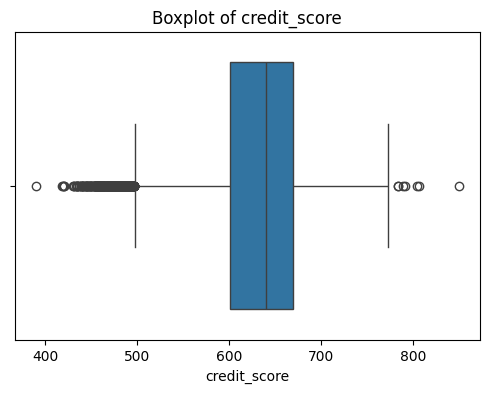

In [24]:
numerical_cols = ['person_age', 'person_income', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score']
for col in numerical_cols:
    print(f"\nSummary Statistics for {col}:")
    print(df[col].describe())
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

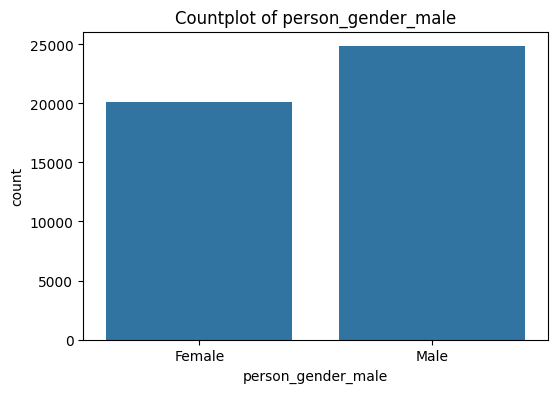

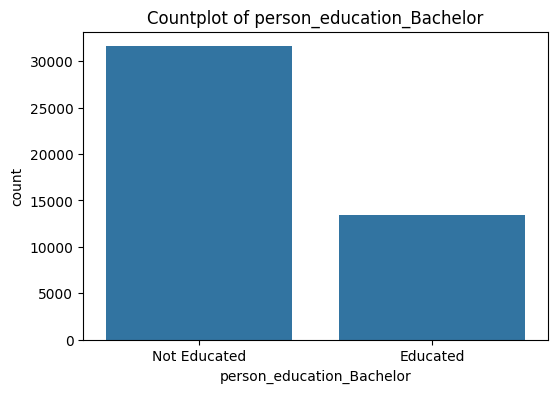

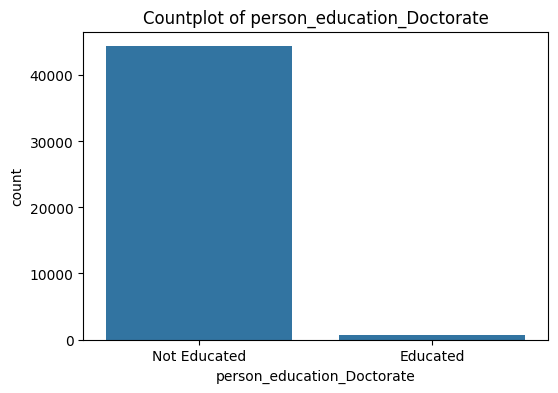

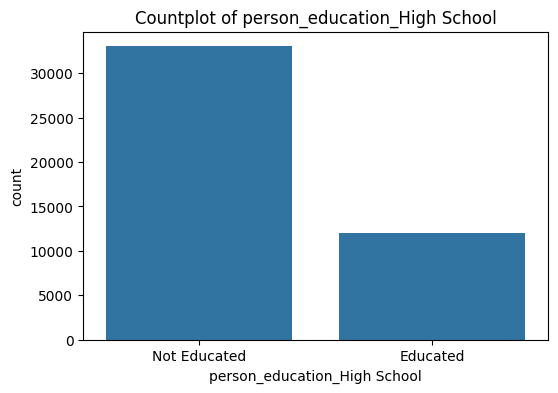

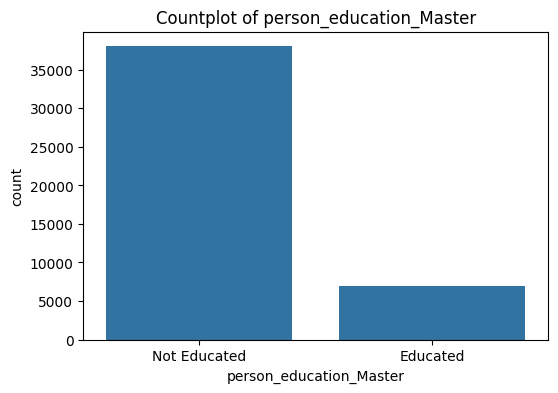

...

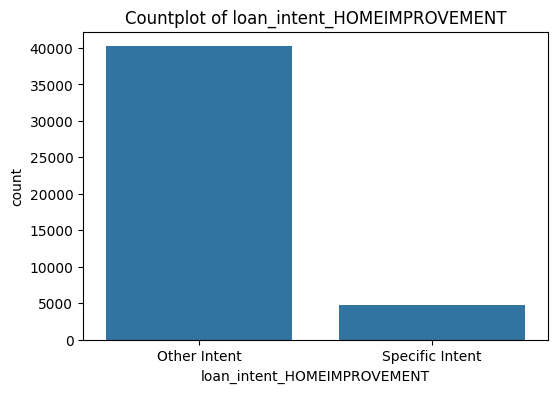

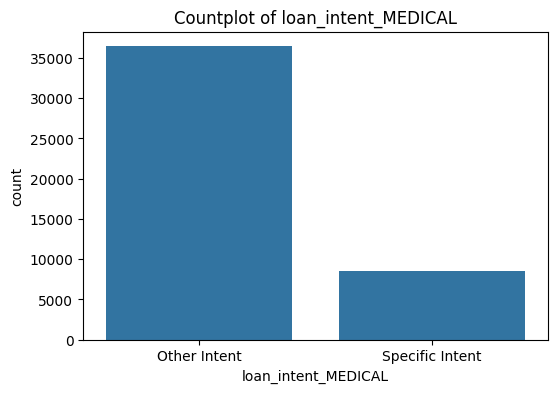

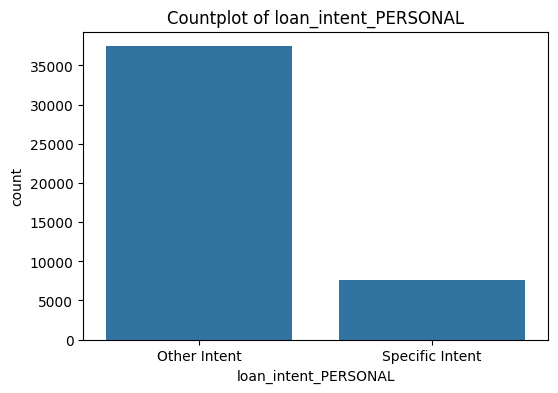

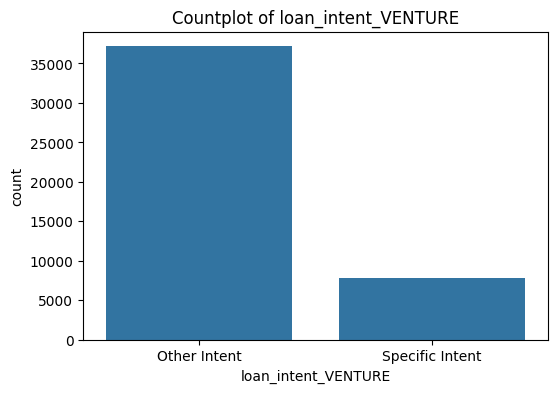

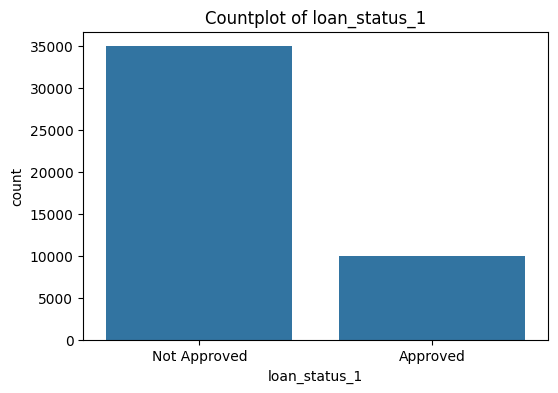

In [29]:
encoded_categorical_cols = [col for col in df.columns if any(sub in col for sub in ['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'loan_status'])]
for col in encoded_categorical_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=df[col])
    plt.title(f'Countplot of {col}')
    if 'gender' in col:
        plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])
    elif 'education' in col:
        plt.xticks(ticks=[0, 1], labels=['Not Educated', 'Educated'])
    elif 'home_ownership' in col:
        plt.xticks(ticks=[0, 1], labels=['No Ownership', 'Ownership'])
    elif 'loan_intent' in col:
        plt.xticks(ticks=[0, 1], labels=['Other Intent', 'Specific Intent'])
    elif 'loan_status' in col:
        plt.xticks(ticks=[0, 1], labels=['Not Approved', 'Approved'])
    plt.show()

# Bivariate Analysis

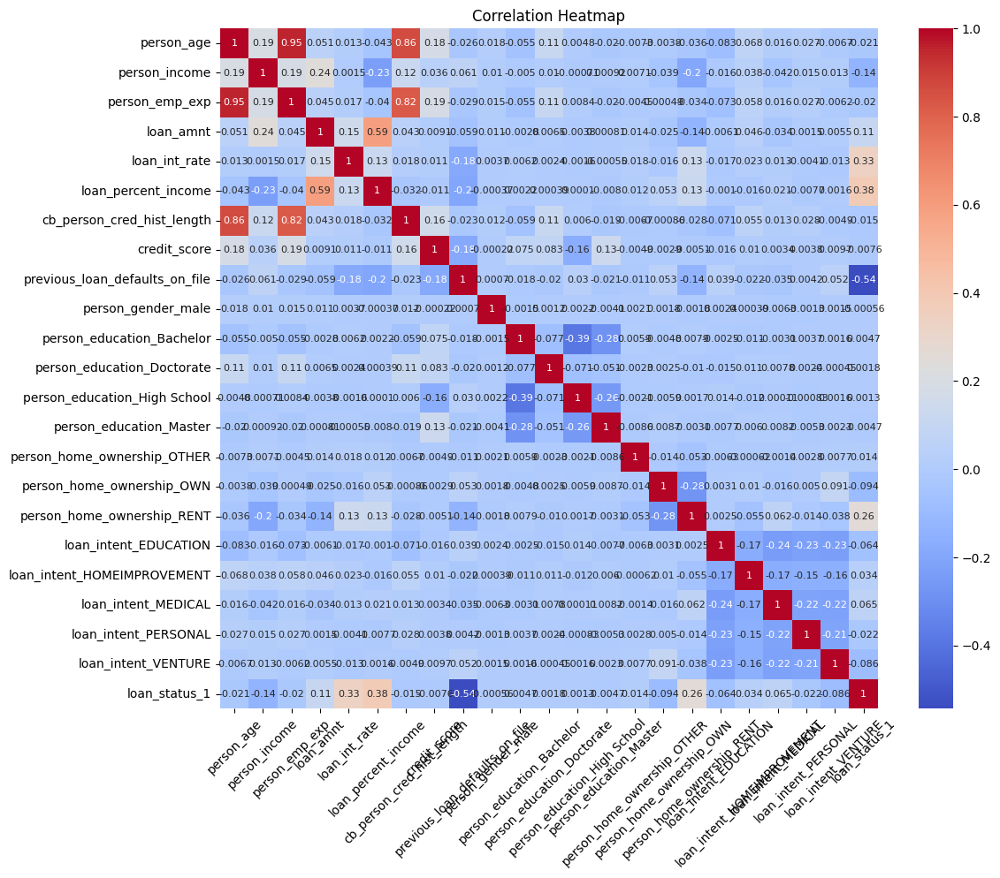

In [33]:
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', annot_kws={"size": 8})
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.title('Correlation Heatmap')
plt.show()

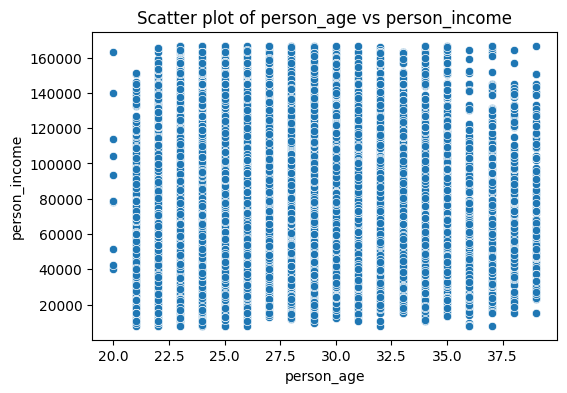

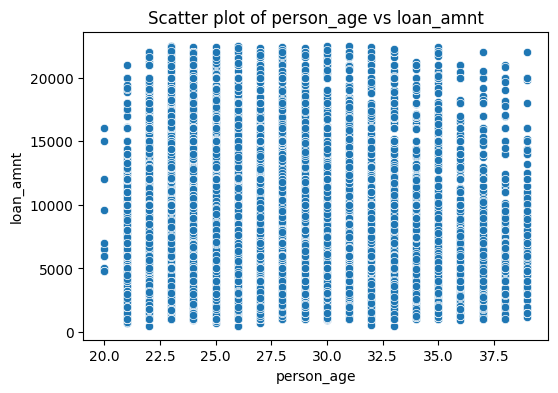

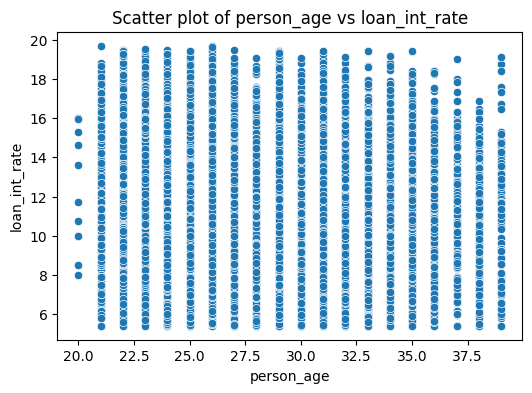

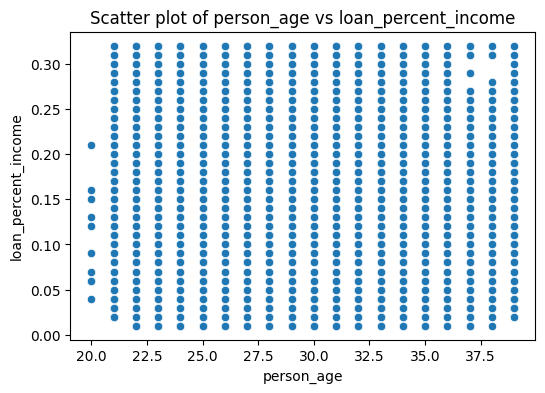

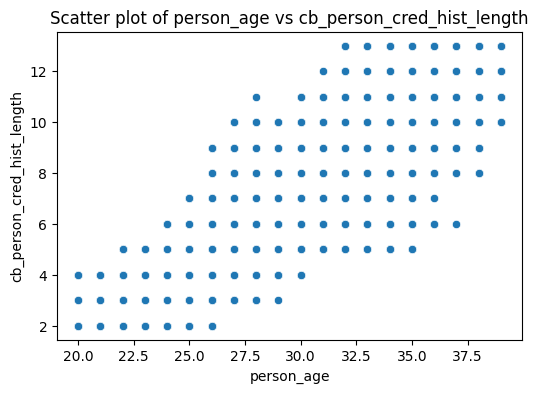

...

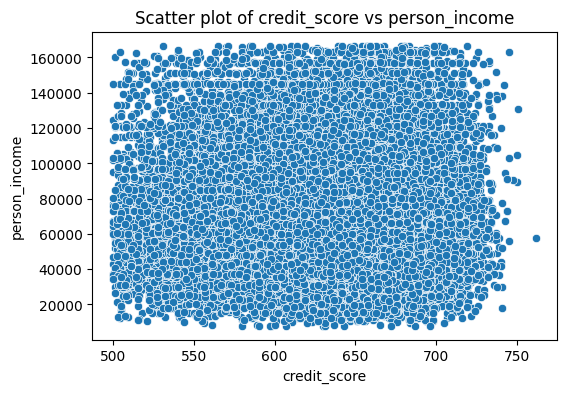

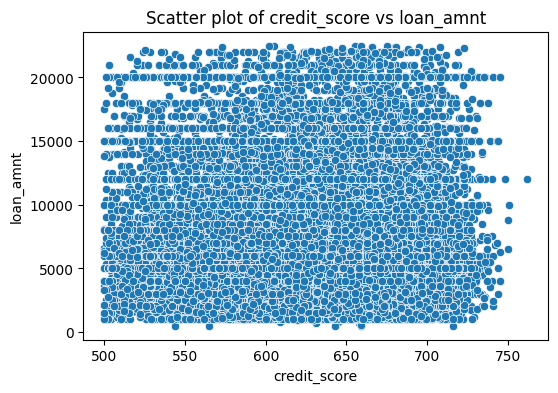

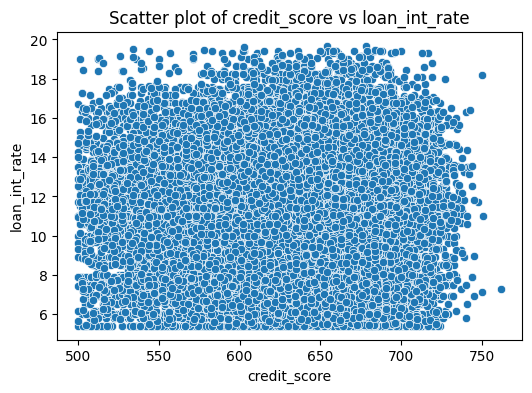

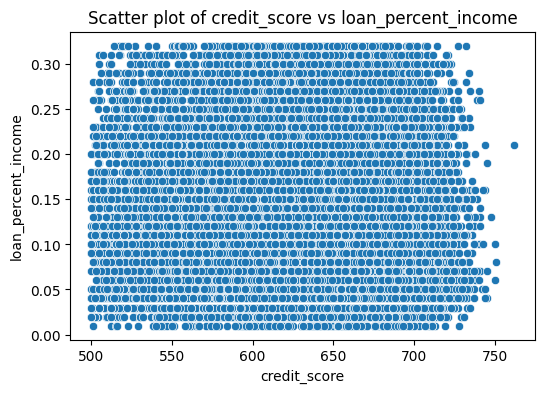

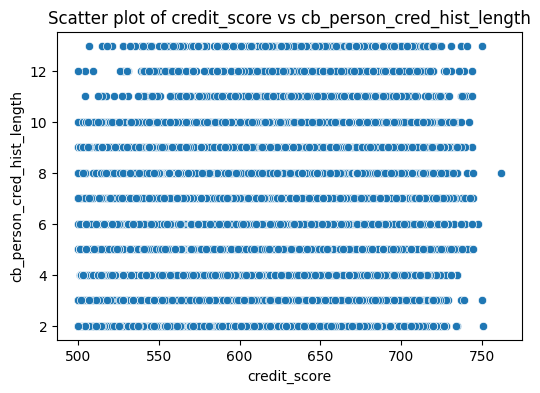

In [48]:
for col1 in numerical_cols:
    for col2 in numerical_cols:
        if col1 != col2:
            plt.figure(figsize=(6, 4))
            sns.scatterplot(x=df[col1], y=df[col2])
            plt.title(f'Scatter plot of {col1} vs {col2}')
            plt.show()

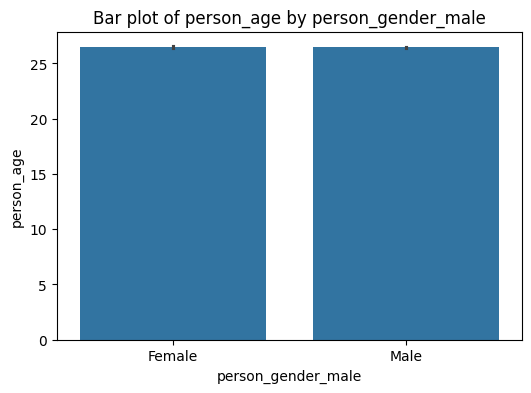

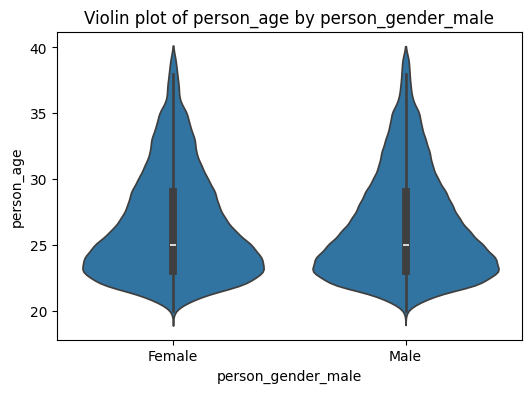

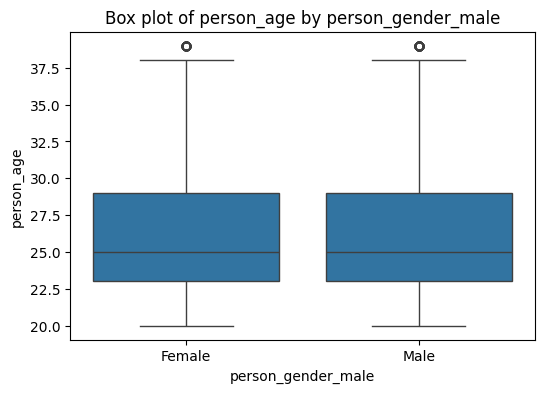

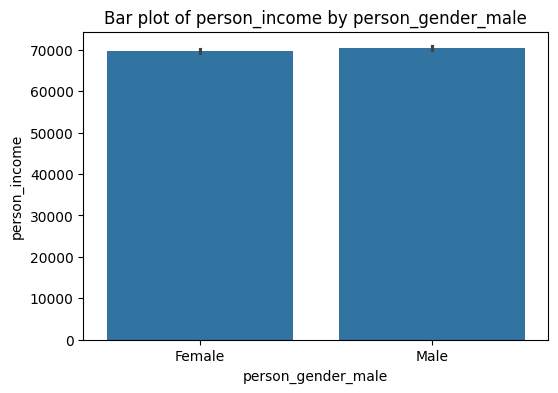

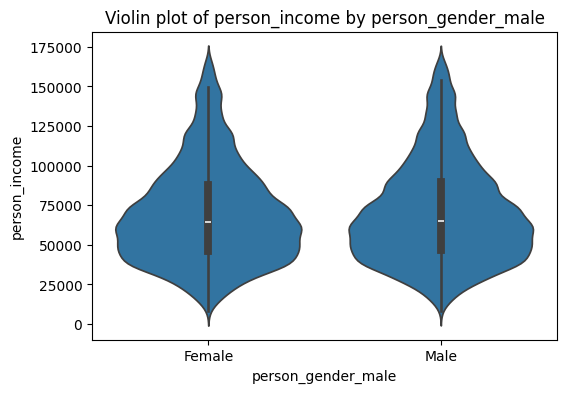

...

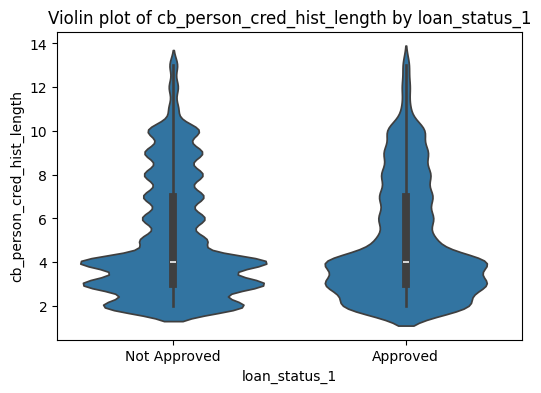

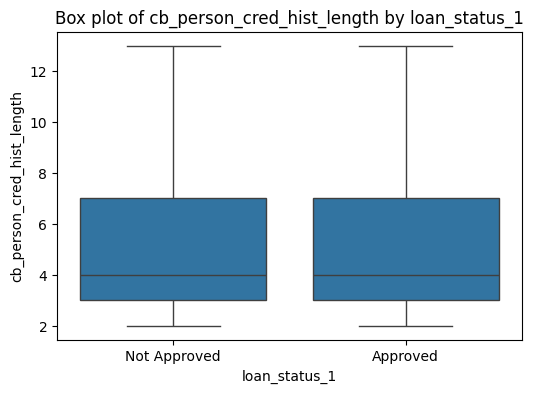

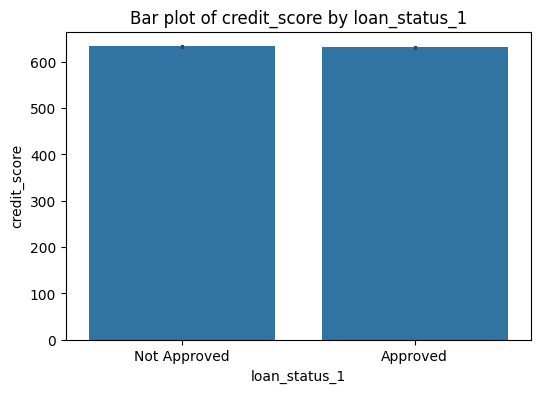

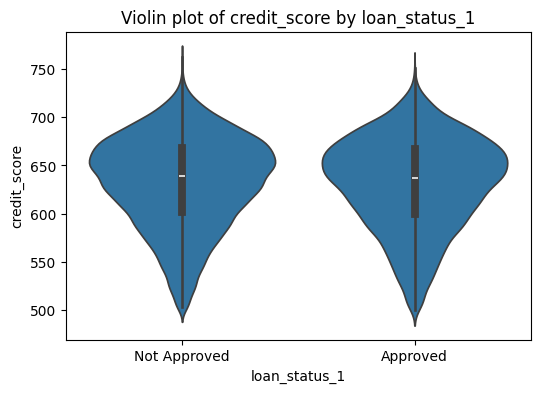

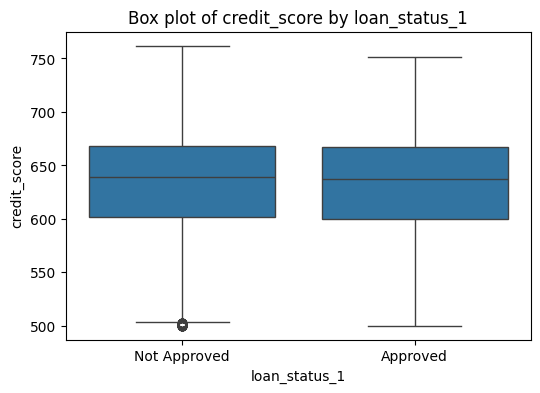

In [47]:
for cat_col in encoded_categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(6, 4))
        sns.barplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Bar plot of {num_col} by {cat_col}')
        if 'gender' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])
        elif 'education' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Not Educated', 'Educated'])
        elif 'home_ownership' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['No Ownership', 'Ownership'])
        elif 'loan_intent' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Other Intent', 'Specific Intent'])
        elif 'loan_status' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Not Approved', 'Approved'])
        plt.show()

        plt.figure(figsize=(6, 4))
        sns.violinplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Violin plot of {num_col} by {cat_col}')
        if 'gender' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])
        elif 'education' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Not Educated', 'Educated'])
        elif 'home_ownership' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['No Ownership', 'Ownership'])
        elif 'loan_intent' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Other Intent', 'Specific Intent'])
        elif 'loan_status' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Not Approved', 'Approved'])
        plt.show()

        plt.figure(figsize=(6, 4))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        if 'gender' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])
        elif 'education' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Not Educated', 'Educated'])
        elif 'home_ownership' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['No Ownership', 'Ownership'])
        elif 'loan_intent' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Other Intent', 'Specific Intent'])
        elif 'loan_status' in cat_col:
            plt.xticks(ticks=[0, 1], labels=['Not Approved', 'Approved'])
        plt.show()

# Multivariate Analysis

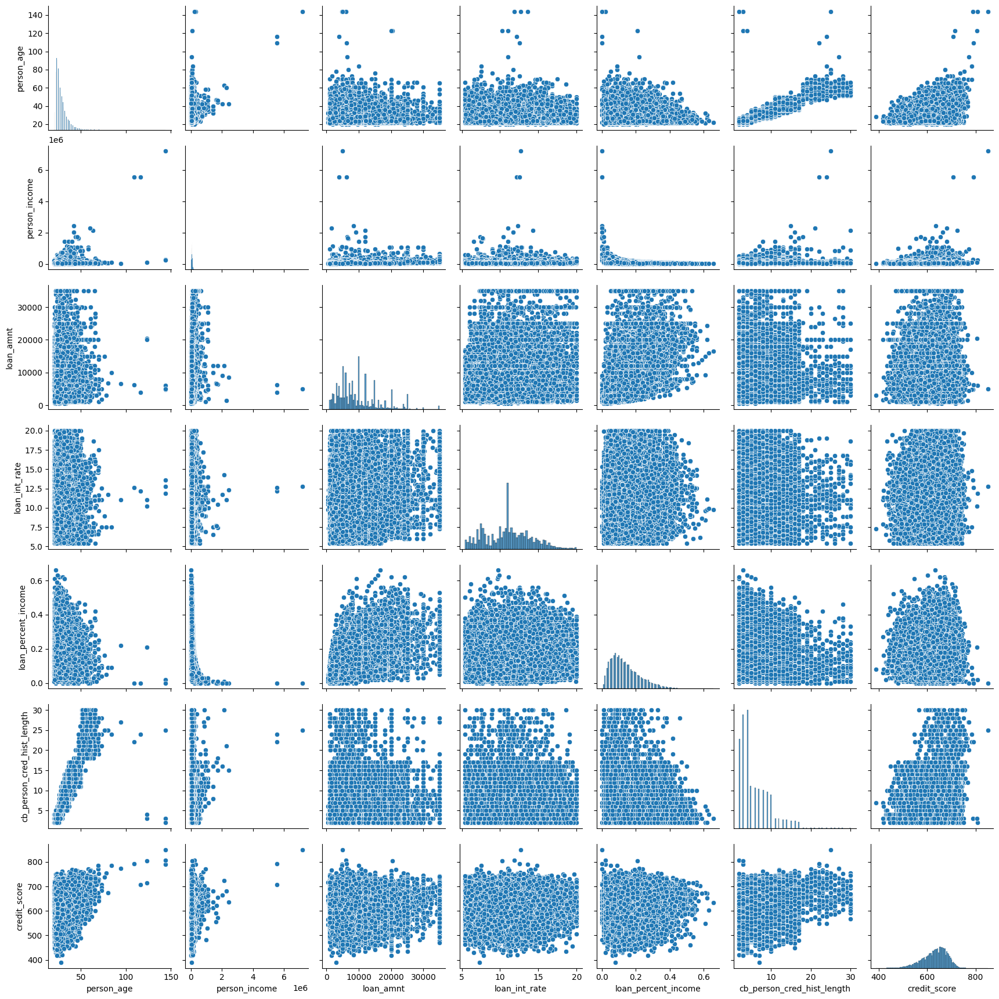

In [34]:
sns.pairplot(df[numerical_cols])
plt.show()

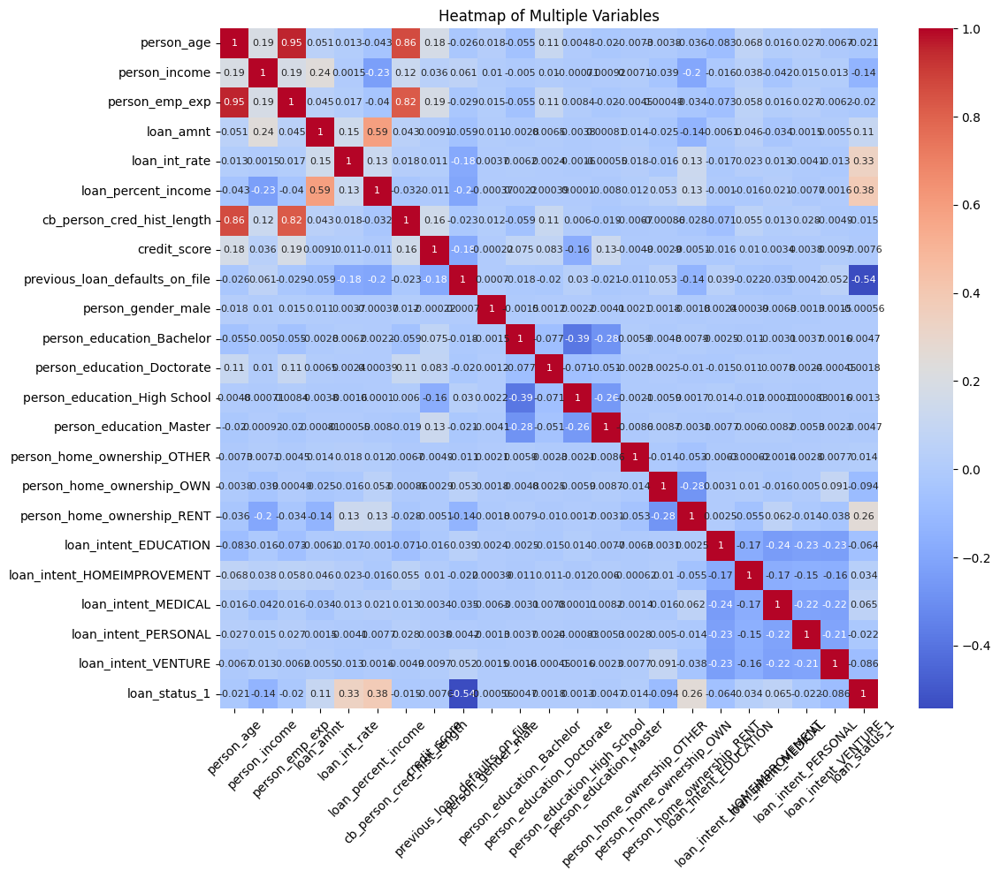

In [35]:
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', annot_kws={"size": 8})
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.title('Heatmap of Multiple Variables')
plt.show()

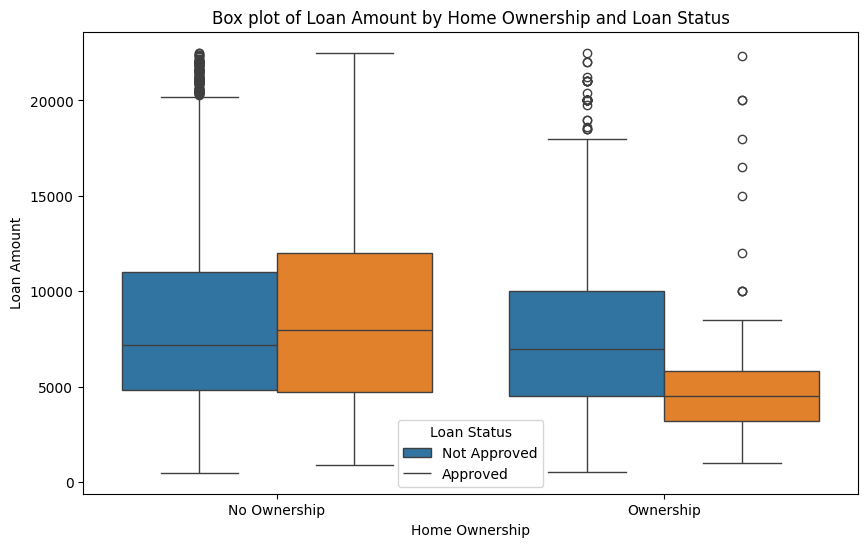

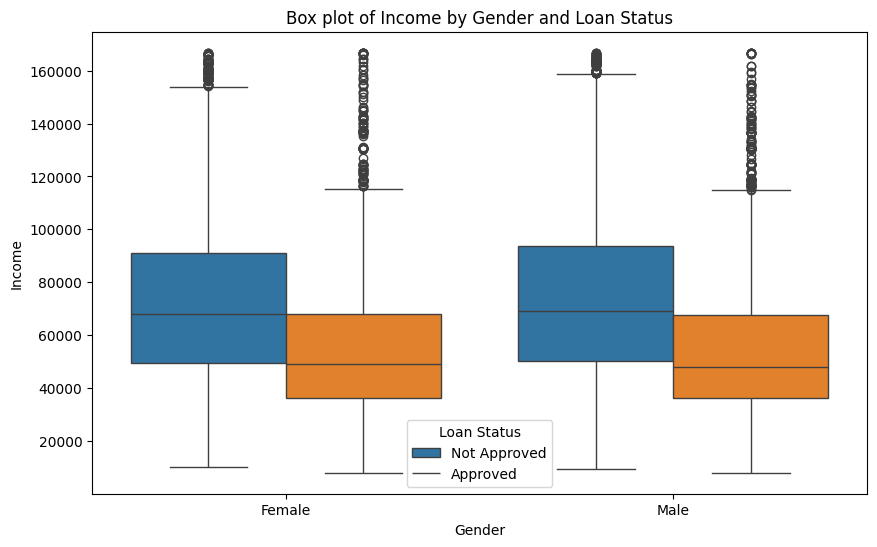

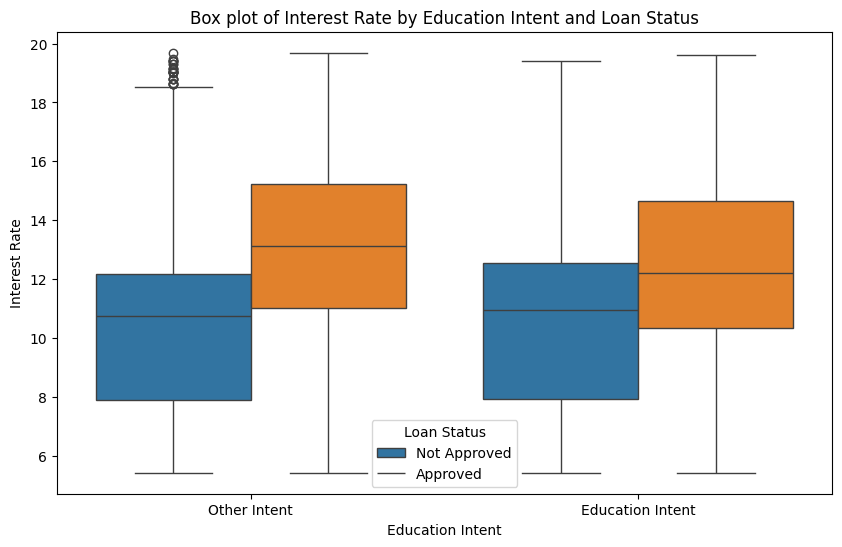

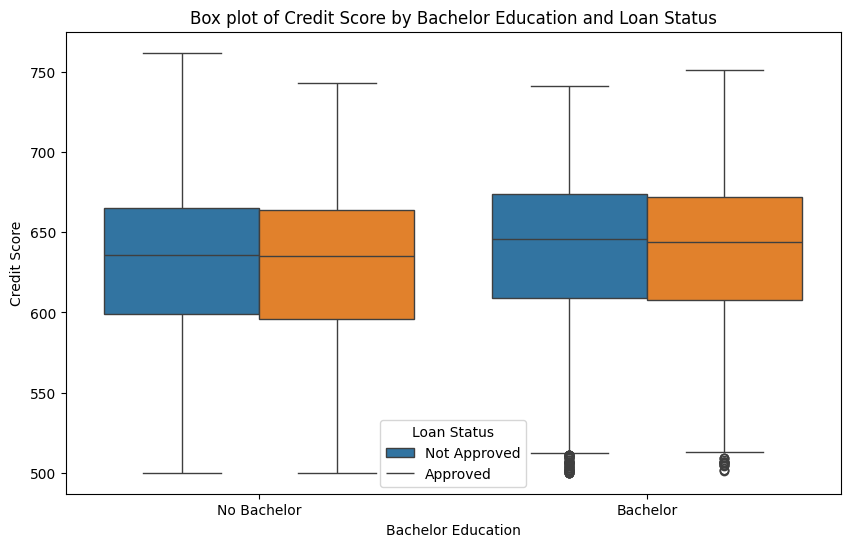

In [54]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='person_home_ownership_OWN', y='loan_amnt', hue='loan_status_1', data=df)
plt.title('Box plot of Loan Amount by Home Ownership and Loan Status')
plt.xticks(ticks=[0, 1], labels=['No Ownership', 'Ownership'])
plt.xlabel('Home Ownership')
plt.ylabel('Loan Amount')
plt.legend(title='Loan Status', labels=['Not Approved', 'Approved'])
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='person_gender_male', y='person_income', hue='loan_status_1', data=df)
plt.title('Box plot of Income by Gender and Loan Status')
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])
plt.xlabel('Gender')
plt.ylabel('Income')
plt.legend(title='Loan Status', labels=['Not Approved', 'Approved'])
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='loan_intent_EDUCATION', y='loan_int_rate', hue='loan_status_1', data=df)
plt.title('Box plot of Interest Rate by Education Intent and Loan Status')
plt.xticks(ticks=[0, 1], labels=['Other Intent', 'Education Intent'])
plt.xlabel('Education Intent')
plt.ylabel('Interest Rate')
plt.legend(title='Loan Status', labels=['Not Approved', 'Approved'])
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='person_education_Bachelor', y='credit_score', hue='loan_status_1', data=df)
plt.title('Box plot of Credit Score by Bachelor Education and Loan Status')
plt.xticks(ticks=[0, 1], labels=['No Bachelor', 'Bachelor'])
plt.xlabel('Bachelor Education')
plt.ylabel('Credit Score')
plt.legend(title='Loan Status', labels=['Not Approved', 'Approved'])
plt.show()
